In [6]:
import os
import numpy as np

def parse_action_file(filepath):
    """
    Parses a given action file and extracts the (100,3) array.
    """
    action_values = []
    with open(filepath, 'r') as file:
        for line in file:
            if line.strip():  # Skip empty lines
                parts = line.split(':')
                if len(parts) > 1:
                    values = parts[1].strip()[1:-1].split(', ')
                    action_values.append([float(v) for v in values])
            if len(action_values) == 200:  # Stop after 100 entries
                break
    return np.array(action_values)

def parse_latent_file(filepath):
    """
    Parses the latent_sample.txt file and extracts latent_z values for each action_seed.
    """
    latent_dict = {}
    with open(filepath, 'r') as file:
        current_seed = None
        for line in file:
            if line.startswith("action_seed:"):
                current_seed = int(line.strip().split(':')[1])
            elif current_seed is not None:
                # Parse latent_z values
                latent_z = [float(v) for v in line.strip().split()]
                # print(latent_z)
                latent_dict[current_seed] = np.array(latent_z).reshape(1, -1)
                print(latent_dict)
    return latent_dict

def parse_latent_file(filepath):
    """
    Parses the latent_sample.txt file and extracts latent_z values for each action_seed.
    """
    latent_dict = {}
    with open(filepath, 'r') as file:
        current_seed = None
        for line in file:
            if line.startswith("action_seed:"):
                current_seed = int(line.strip().split(':')[1])
            elif current_seed is not None:
                if current_seed in latent_dict:
                    # Skip if the key already exists
                    continue
                # Parse latent_z values
                latent_z = [float(v) for v in line.strip().split()]
                latent_dict[current_seed] = np.array(latent_z).reshape(1, -1)
    return latent_dict

def create_action_latent_dicts(action_dir, latent_file):
    """
    Combines action values and latent_z values into dictionaries for all action files.
    """
    # Parse latent file
    latent_data = parse_latent_file(latent_file)

    # Create the list of dictionaries
    result = []
    for i in range(16 ,450):  # Iterate through action16.txt to action216.txt
        action_file = os.path.join(action_dir, f"actions{i}.txt")
        if os.path.exists(action_file):
            action_values = parse_action_file(action_file)
            latent_z = latent_data.get(i, np.zeros((1, 32)))  # Default to zero array if not found
            # print(latent_z)
            result.append({
                f"action_value{i}": action_values,
                f"latent_z{i}": latent_z
            })
    return result

# Main execution
if __name__ == "__main__":
    action_directory = "/home/shuntaroitakuralab/tmc_wrs_docker/act/action_gen/"
    latent_sample_file = os.path.join(action_directory, "latent_samples.txt")

    # Generate the array of dictionaries
    action_latent_dicts = create_action_latent_dicts(action_directory, latent_sample_file)

    # Example: Print the first dictionary
    print(action_latent_dicts)


[{'action_value16': array([[-0.15751487, -0.38008782, -0.1853444 ],
       [-0.14002734, -0.35423189, -0.13177663],
       [-0.12809777, -0.34325483, -0.1042853 ],
       [-0.10478956, -0.32121819, -0.07102531],
       [-0.0265336 , -0.29920381, -0.00555509],
       [ 0.0181942 , -0.29827756,  0.06519669],
       [ 0.1124486 , -0.24896498,  0.19025177],
       [ 0.19315246, -0.23234639,  0.32241291],
       [ 0.28509346, -0.23232009,  0.46702504],
       [ 0.41046813, -0.23018357,  0.61505067],
       [ 0.60203296, -0.23890296,  0.84538817],
       [ 0.760463  , -0.26781893,  1.08392882],
       [ 0.95941597, -0.27242851,  1.33902121],
       [ 1.07566631, -0.26087162,  1.62537158],
       [ 1.34243488, -0.26929238,  1.9437387 ],
       [ 1.40549612, -0.24112239,  2.01472449],
       [ 1.56346941, -0.21232422,  2.14783049],
       [ 1.61196947, -0.21299092,  2.19597101],
       [ 1.68235707, -0.2255421 ,  2.28537679],
       [ 1.6371727 , -0.19987999,  2.29331088],
       [ 1.64723992,

In [7]:
print(action_latent_dicts)

[{'action_value16': array([[-0.15751487, -0.38008782, -0.1853444 ],
       [-0.14002734, -0.35423189, -0.13177663],
       [-0.12809777, -0.34325483, -0.1042853 ],
       [-0.10478956, -0.32121819, -0.07102531],
       [-0.0265336 , -0.29920381, -0.00555509],
       [ 0.0181942 , -0.29827756,  0.06519669],
       [ 0.1124486 , -0.24896498,  0.19025177],
       [ 0.19315246, -0.23234639,  0.32241291],
       [ 0.28509346, -0.23232009,  0.46702504],
       [ 0.41046813, -0.23018357,  0.61505067],
       [ 0.60203296, -0.23890296,  0.84538817],
       [ 0.760463  , -0.26781893,  1.08392882],
       [ 0.95941597, -0.27242851,  1.33902121],
       [ 1.07566631, -0.26087162,  1.62537158],
       [ 1.34243488, -0.26929238,  1.9437387 ],
       [ 1.40549612, -0.24112239,  2.01472449],
       [ 1.56346941, -0.21232422,  2.14783049],
       [ 1.61196947, -0.21299092,  2.19597101],
       [ 1.68235707, -0.2255421 ,  2.28537679],
       [ 1.6371727 , -0.19987999,  2.29331088],
       [ 1.64723992,

In [8]:

import numpy as np

data = action_latent_dicts  # あなたのデータをここに挿入してください
start_num = 16


# ラベル付け処理
for i, entry in enumerate(data):
    action_key = f"action_value{start_num + i}"
    label_key = f"custom_label{start_num + i}"

    # action_valueの (100,3) 配列を取得
    action_value = entry[action_key]

    first_dimension = action_value[:,0]
    second_dimension = action_value[:,1]
    third_dimension = action_value[:, 2]

    if (third_dimension >= 0.5).any() :
        label = 1
    else:
        label = 0
    

    # ラベルを辞書に追加
    entry[label_key] = label

# 結果を確認
for i, entry in enumerate(data):
    action_key = f"action_value{start_num + i}"
    label_key = f"custom_label{start_num + i}"
    print(f"{action_key}: Label {entry[label_key]}")


action_value16: Label 1
action_value17: Label 1
action_value18: Label 0
action_value19: Label 0
action_value20: Label 0
action_value21: Label 1
action_value22: Label 1
action_value23: Label 1
action_value24: Label 1
action_value25: Label 1
action_value26: Label 1
action_value27: Label 1
action_value28: Label 1
action_value29: Label 1
action_value30: Label 1
action_value31: Label 1
action_value32: Label 1
action_value33: Label 1
action_value34: Label 1
action_value35: Label 1
action_value36: Label 1
action_value37: Label 1
action_value38: Label 1
action_value39: Label 1
action_value40: Label 1
action_value41: Label 1
action_value42: Label 1
action_value43: Label 1
action_value44: Label 1
action_value45: Label 1
action_value46: Label 1
action_value47: Label 1
action_value48: Label 1
action_value49: Label 1
action_value50: Label 1
action_value51: Label 1
action_value52: Label 1
action_value53: Label 1
action_value54: Label 1
action_value55: Label 1
action_value56: Label 1
action_value57: 

In [9]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE

# # ラベル付け済みのデータを使用
# data = action_latent_dicts  # あなたのデータをここに挿入してください


# # latent_zの値を収集して (200, 32) 配列を作成
# latent_z_values = np.array([entry[f'latent_z{start_num + i}'].flatten() for i, entry in enumerate(data)])

# # クラスラベルの取得
# labels = np.array([entry[f'custom_label{start_num + i}'] for i, entry in enumerate(data)])

# # PCAによる次元圧縮
# pca = PCA(n_components=2)
# latent_z_pca = pca.fit_transform(latent_z_values)

# # PCAの寄与率を取得
# explained_variance_ratio = pca.explained_variance_ratio_
# print(f"PCA 寄与率: {explained_variance_ratio}")

# # t-SNEによる次元圧縮
# tsne = TSNE(n_components=2, random_state=0, perplexity=20)
# latent_z_tsne = tsne.fit_transform(latent_z_values)

# # プロット関数
# def plot_2d(data, labels, title, method_name):
#     plt.figure(figsize=(8, 6))
#     for label in np.unique(labels):
#         indices = labels == label
#         plt.scatter(data[indices, 0], data[indices, 1], label=f'Class {label}', alpha=0.7)
#     plt.title(f"{title} ({method_name})")
#     plt.xlabel("Component 1")
#     plt.ylabel("Component 2")
#     plt.legend()
#     plt.grid()
#     plt.show()

# # PCAのプロット
# plot_2d(latent_z_pca, labels, "Latent Space Visualization", "PCA")

# # t-SNEのプロット
# plot_2d(latent_z_tsne, labels, "Latent Space Visualization", "t-SNE")


平均が 0.5 より大きい次元: [ 2 14 15]


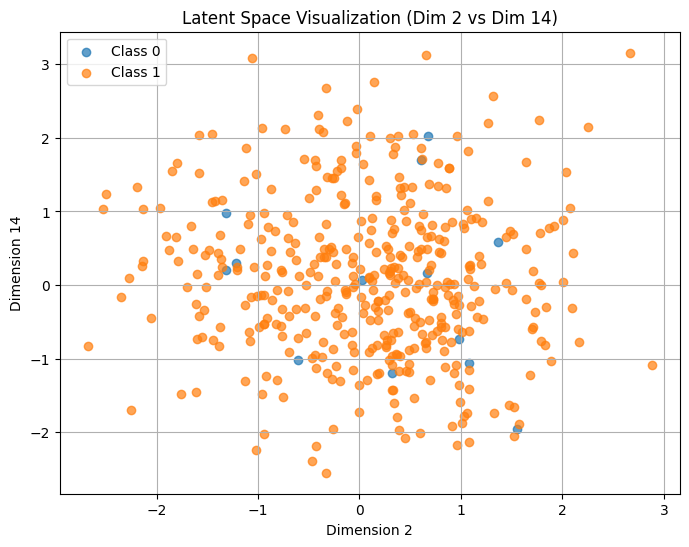

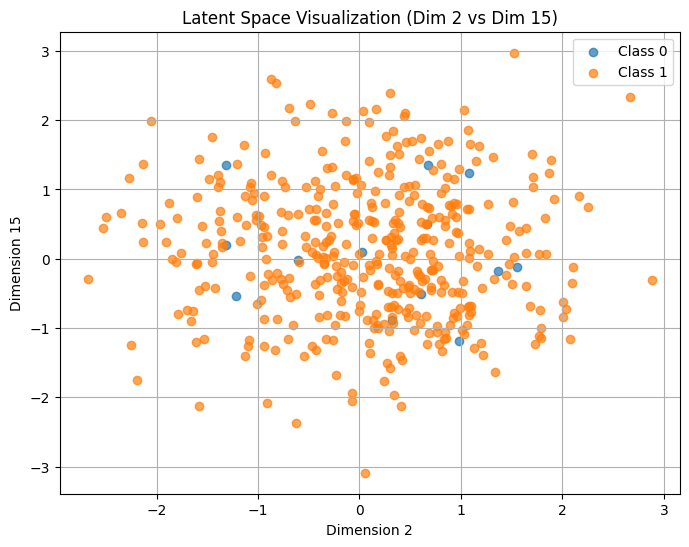

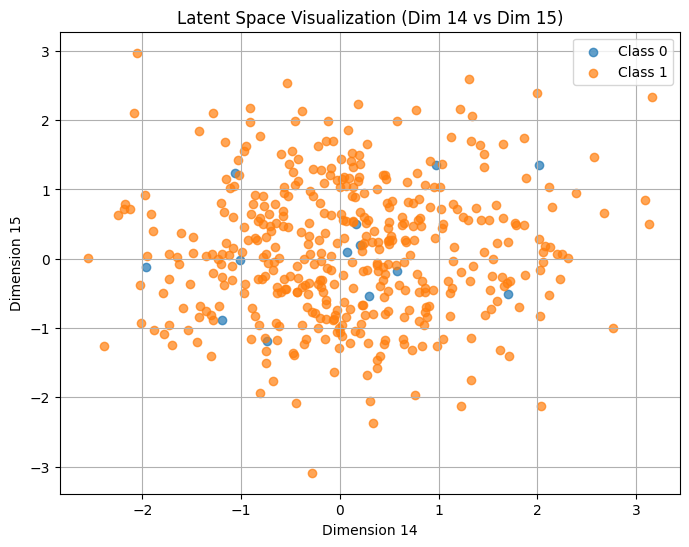

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# ラベル付け済みのデータを使用
data = action_latent_dicts  # あなたのデータをここに挿入してください


# latent_zの値を収集して (200, 32) 配列を作成
latent_z_values = np.array([entry[f'latent_z{start_num + i}'].flatten() for i, entry in enumerate(data)])

# クラスラベルの取得
labels = np.array([entry[f'custom_label{start_num + i}'] for i, entry in enumerate(data)])

# 各次元の平均を計算
dimension_means = np.mean(latent_z_values, axis=0)

# 平均が 0.5 より大きい次元を取得
selected_dimensions = np.where(dimension_means > 0.08)[0]

# 結果の表示
print(f"平均が 0.5 より大きい次元: {selected_dimensions}")

# プロット関数
def plot_selected_dimensions(latent_z_values, labels, selected_dimensions):
    """
    指定した次元を軸にプロットする関数。
    複数の次元が指定された場合、全組み合わせでプロット。
    """
    num_dimensions = len(selected_dimensions)
    
    if num_dimensions < 2:
        print("プロットするには少なくとも2つの次元が必要です。")
        return
    
    # 全組み合わせでプロット
    for i in range(num_dimensions):
        for j in range(i + 1, num_dimensions):
            dim_x, dim_y = selected_dimensions[i], selected_dimensions[j]
            
            # プロット
            plt.figure(figsize=(8, 6))
            for label in np.unique(labels):
                indices = labels == label
                plt.scatter(
                    latent_z_values[indices, dim_x], 
                    latent_z_values[indices, dim_y], 
                    label=f'Class {label}', alpha=0.7
                )
            plt.title(f"Latent Space Visualization (Dim {dim_x} vs Dim {dim_y})")
            plt.xlabel(f"Dimension {dim_x}")
            plt.ylabel(f"Dimension {dim_y}")
            plt.legend()
            plt.grid()
            plt.show()

# プロット実行
plot_selected_dimensions(latent_z_values, labels, selected_dimensions)
